# Start

Será usado Pytorch como biblioteca principal, treinamento com imagens na escala cinza de tamanho 64x64, e uma arquitetura simples de rede neural com camadas de convolução.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms, models
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import numpy as np
import os
import torch.nn.functional as F


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)

In [ ]:
transform =  transforms.Compose([
        transforms.Resize(64),
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
    ])

In [ ]:
data_dir = '/content/dataset/train_dataset'
image_dataset = datasets.ImageFolder(root=data_dir, transform=transform)

# Calculate the sizes of train and test datasets
train_size = int(0.85 * len(image_dataset))
test_size = len(image_dataset) - train_size
# Get the class names
class_names = image_dataset.classes
train_size, test_size

(2138, 378)

In [ ]:
# Split the dataset
train_dataset, test_dataset = random_split(image_dataset, [train_size, test_size])

# Create DataLoaders for the train and test datasets
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=378, shuffle=False, num_workers=4)

In [ ]:
def imshow(img, labels):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title("Labels: " + ' '.join(f'{labels[j]}' for j in range(len(labels))))
    plt.show()

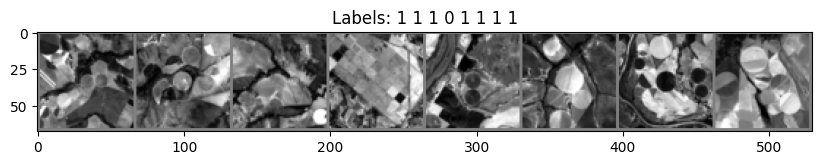

In [ ]:
# Get a batch of training data
dataiter = iter(test_loader)
images, labels = next(dataiter)

# Call the function to display images
imshow(torchvision.utils.make_grid(images[:8]), labels[:8])

# Training

In [ ]:
class CNN_Arch(nn.Module):
    def __init__(self):
        super(CNN_Arch, self).__init__()
        self.network = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Flatten(),
            nn.Linear(128 * 8 * 8, 256),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(256, 2)
        )

    def forward(self, x):
        return self.network(x)

In [ ]:
model = CNN_Arch().to(device)

In [ ]:

from torchsummary import summary
summary(model, (1, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 64, 64]             320
              ReLU-2           [-1, 32, 64, 64]               0
         MaxPool2d-3           [-1, 32, 32, 32]               0
            Conv2d-4           [-1, 64, 32, 32]          18,496
              ReLU-5           [-1, 64, 32, 32]               0
         MaxPool2d-6           [-1, 64, 16, 16]               0
            Conv2d-7          [-1, 128, 16, 16]          73,856
              ReLU-8          [-1, 128, 16, 16]               0
         MaxPool2d-9            [-1, 128, 8, 8]               0
          Flatten-10                 [-1, 8192]               0
           Linear-11                  [-1, 256]       2,097,408
             ReLU-12                  [-1, 256]               0
          Dropout-13                  [-1, 256]               0
           Linear-14                   

In [ ]:

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 30
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}")


Epoch [1/30], Loss: 0.5006
Epoch [2/30], Loss: 0.3672
Epoch [3/30], Loss: 0.3076
Epoch [4/30], Loss: 0.2653
Epoch [5/30], Loss: 0.2010
Epoch [6/30], Loss: 0.1332
Epoch [7/30], Loss: 0.0739
Epoch [8/30], Loss: 0.0606
Epoch [9/30], Loss: 0.0281
Epoch [10/30], Loss: 0.0564
Epoch [11/30], Loss: 0.0167
Epoch [12/30], Loss: 0.0049
Epoch [13/30], Loss: 0.0015
Epoch [14/30], Loss: 0.0008
Epoch [15/30], Loss: 0.0005
Epoch [16/30], Loss: 0.0005
Epoch [17/30], Loss: 0.0003
Epoch [18/30], Loss: 0.0003
Epoch [19/30], Loss: 0.0002
Epoch [20/30], Loss: 0.0002
Epoch [21/30], Loss: 0.0002
Epoch [22/30], Loss: 0.0001
Epoch [23/30], Loss: 0.0001
Epoch [24/30], Loss: 0.0001
Epoch [25/30], Loss: 0.0001
Epoch [26/30], Loss: 0.0002
Epoch [27/30], Loss: 0.0008
Epoch [28/30], Loss: 0.1016
Epoch [29/30], Loss: 0.0423
Epoch [30/30], Loss: 0.0147


## Salvar Modelo

In [ ]:
#torch.save(model, 'cnn_model.pth')

In [ ]:
#model = torch.load('cnn_model.pth')

/tmp/ipykernel_128489/2626806129.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('cnn_model.pth')


# Evaluation

In [ ]:
from PIL import Image

def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize(64),
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
    ])
    image = Image.open(image_path)
    image = transform(image).unsqueeze(0)  # Add batch dimension

    return image

def predict_image(image_path, model):
    image = preprocess_image(image_path).to(device)
    labels_dict = {
    0: "not_pivot",
    1: "pivot"

}
    with torch.no_grad():
        outputs = model(image)
        _, predicted = torch.max(outputs, 1)

    return str(labels_dict[predicted.item()])

In [ ]:
predict_image('dataset-20240808T021407Z-001/dataset/teste/tile_00001.png', model)

'not_pivot'

In [ ]:
def test_images_predict(dataiter):
    images, labels = next(dataiter)
    images, labels = images.to(device), labels.to(device)
    result = {'prediction': [], 'true_label': []}
    for i in range(len(images)):
        image = images[i]
        image = image.unsqueeze(0)
        label = labels[i]
        with torch.no_grad():
            outputs = model(image)
            _, predicted = torch.max(outputs, 1)

            result['true_label'].append(label.item())
            result['prediction'].append(predicted.item())
    return result

In [ ]:
preds = test_images_predict(iter(test_loader))

In [ ]:
target_names = [
   "not_pivot",
 "pivot"
]
print(classification_report(preds['true_label'], preds['prediction'], target_names=target_names))

              precision    recall  f1-score   support

   not_pivot       0.79      0.82      0.81       122
       pivot       0.91      0.90      0.91       256

    accuracy                           0.87       378
   macro avg       0.85      0.86      0.86       378
weighted avg       0.87      0.87      0.87       378



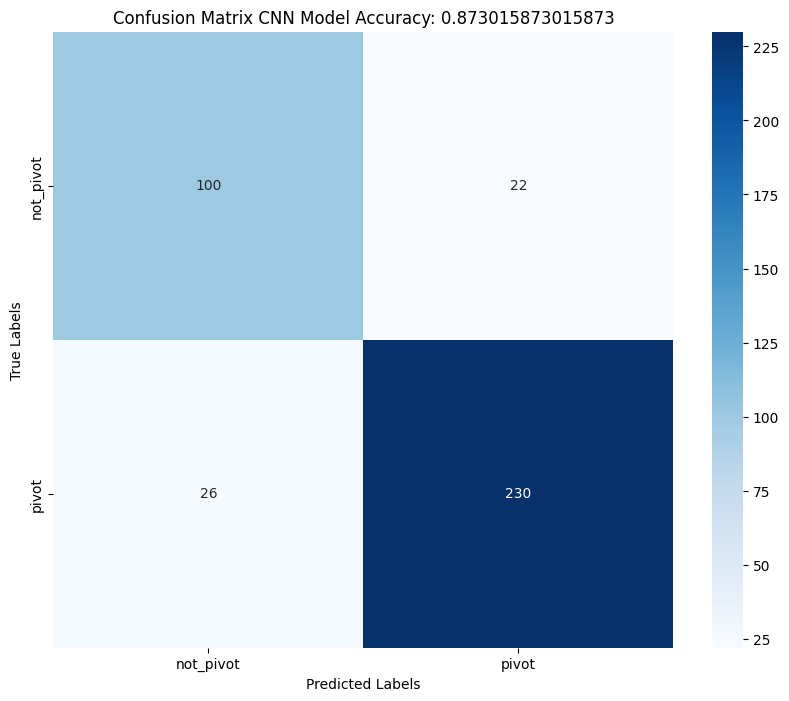

In [ ]:
true_labels = preds['true_label']
predictions = preds['prediction']
cm = confusion_matrix(true_labels, predictions)


plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title(f'Confusion Matrix CNN Model Accuracy: {accuracy_score(true_labels, predictions)}')
plt.show()

# GRID

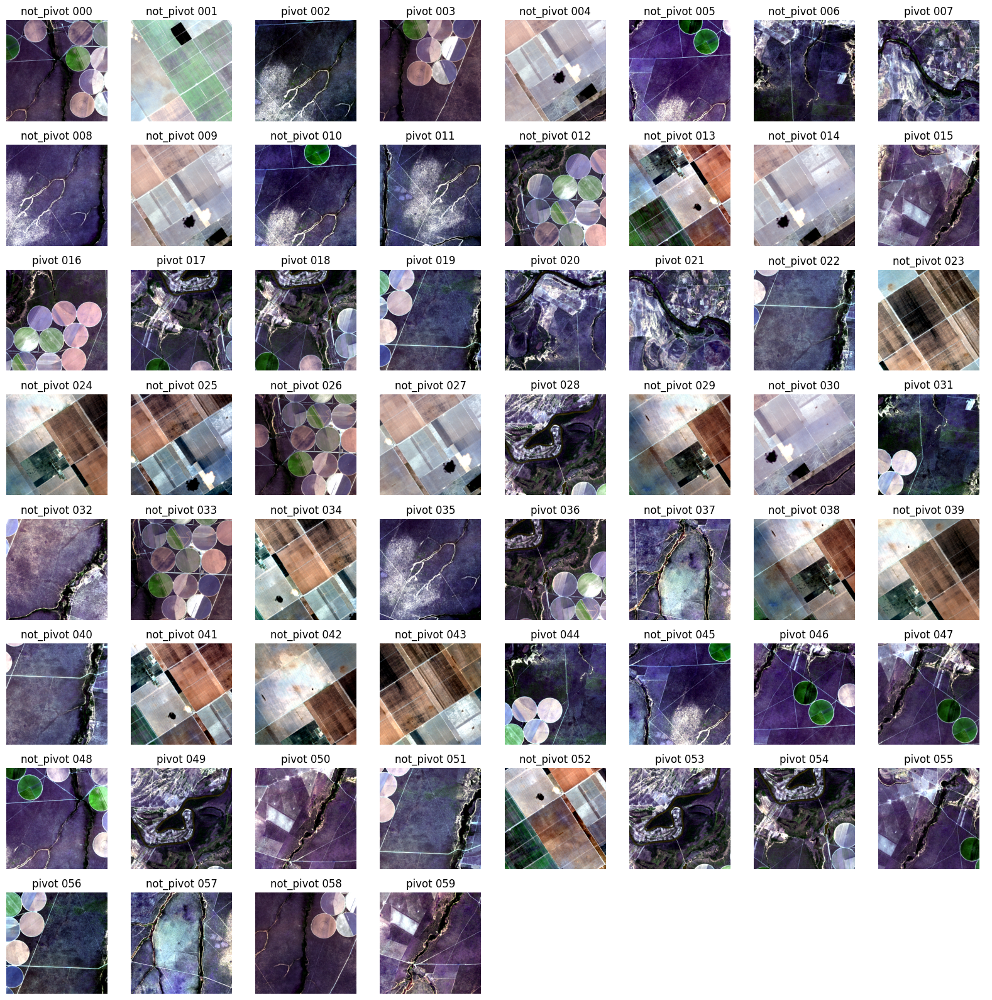

In [ ]:
def predict_images_in_folder(folder_path, model):
    images = []
    predictions = []
    number_images = []

    for image_name in sorted(os.listdir(folder_path)):
        image_path = os.path.join(folder_path, image_name)


        prediction = predict_image(image_path, model)
        predictions.append(prediction)


        image = Image.open(image_path)
        images.append(image)
        number_images.append(image_path[-7:-4])

    n_images = len(images)
    grid_size = int(n_images ** 0.5) + 1


    fig, axes = plt.subplots(grid_size, grid_size, figsize=(16, 16))
    axes = axes.flatten()

    for i in range(n_images):
        axes[i].imshow(images[i], cmap='gray')
        axes[i].set_title(f'{predictions[i]} {number_images[i]}')
        axes[i].axis('off')

    for i in range(n_images, grid_size * grid_size):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


folder_path = 'dataset-20240808T021407Z-001/dataset/teste'
predict_images_in_folder(folder_path, model)

# Probabilities

In [ ]:
def predict_image_2(image_path):
    image = preprocess_image(image_path).to(device)
    labels_dict = {
    0: "not_pivot",
    1: "pivot"

}
    with torch.no_grad():
        outputs = model(image)
        probabilities = F.softmax(outputs, dim=1)  # Apply softmax to get probabilities
        _, predicted = torch.max(probabilities, 1)
        probabilities_dict = {
        labels_dict[i]: round(probabilities[0, i].item(), 4) for i in range(len(labels_dict))
        }
    return str(labels_dict[predicted.item()]), outputs, probabilities_dict

In [ ]:
pred = predict_image_2('dataset-20240808T021407Z-001/dataset/teste/tile_00006.png')
pred

('not_pivot',
 tensor([[ 0.6432, -1.5278]], device='cuda:0'),
 {'not_pivot': 0.8976, 'pivot': 0.1024})

In [ ]:
pred[2]

{'not_pivot': 0.8976, 'pivot': 0.1024}

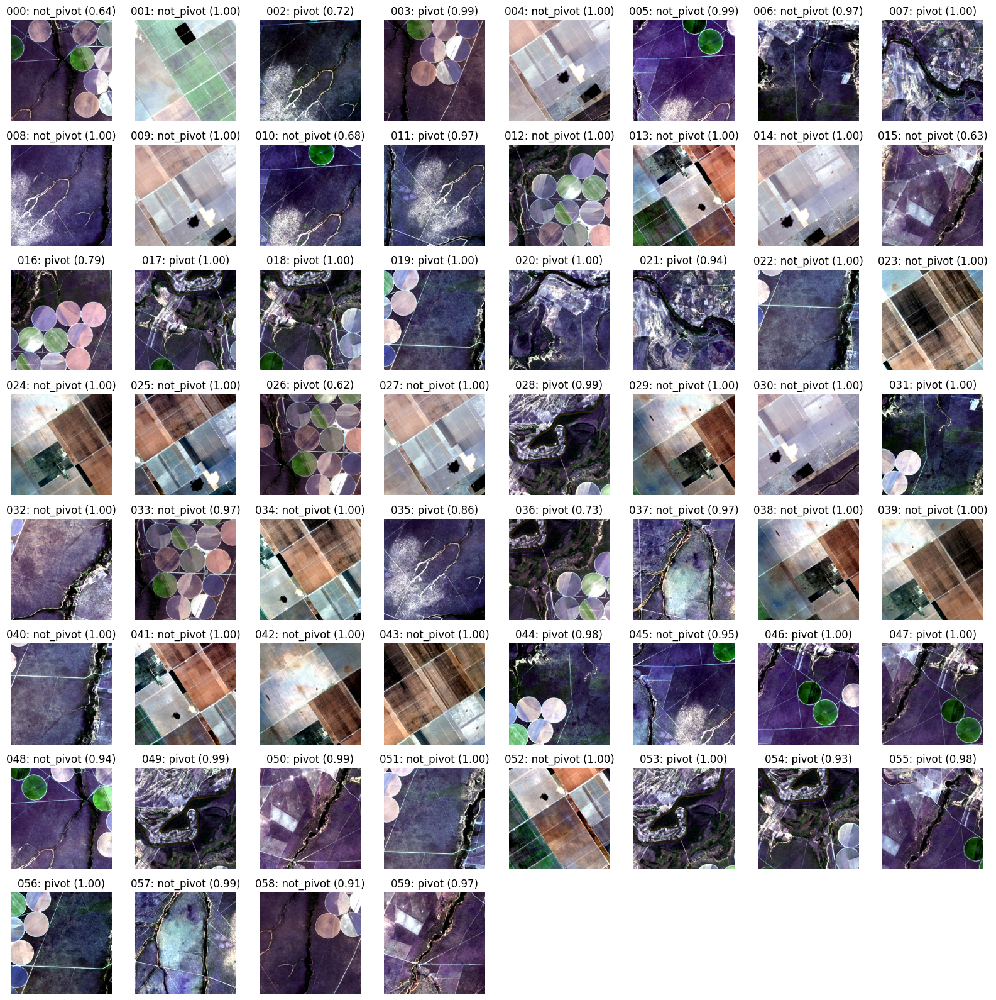

In [ ]:
def predict_image_2(image_path, model):
    image = preprocess_image(image_path).to(device)
    labels_dict = {
        0: "not_pivot",
        1: "pivot"
    }
    with torch.no_grad():
        outputs = model(image)
        probabilities = F.softmax(outputs, dim=1)  # Apply softmax to get probabilities
        _, predicted = torch.max(probabilities, 1)
        probabilities_dict = {
            labels_dict[i]: round(probabilities[0, i].item(), 4) for i in range(len(labels_dict))
        }
    return str(labels_dict[predicted.item()]), max(probabilities_dict.values()), probabilities_dict

def predict_images_in_folder2(folder_path, model):
    images = []
    predictions = []
    probabilities = []
    file_numbers = []


    for image_name in sorted(os.listdir(folder_path)):
        image_path = os.path.join(folder_path, image_name)


        prediction, max_prob, _ = predict_image_2(image_path, model)
        predictions.append(prediction)
        probabilities.append(max_prob)


        image = Image.open(image_path)
        images.append(image)
        file_numbers.append(image_path[-7:-4])

    n_images = len(images)
    grid_size = int(n_images ** 0.5) + 1

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(16, 16))
    axes = axes.flatten()

    for i in range(n_images):
        axes[i].imshow(images[i], cmap='gray')
        axes[i].set_title(f'{file_numbers[i]}: {predictions[i]} ({probabilities[i]:.2f})')
        axes[i].axis('off')

    for i in range(n_images, grid_size * grid_size):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
folder_path = 'dataset-20240808T021407Z-001/dataset/teste'
predict_images_in_folder2(folder_path, model)

# Threshold

Já que não há muito confiança nas estimativas com esse modelo, pensei em fazer um limiar para classificar imagens acima de 99% de probalidade na classe.

In [ ]:
def predict_image_with_threshold(image_path, model, threshold=0.99):
    image = preprocess_image(image_path).to(device)
    labels_dict = {
        0: "not_pivot",
        1: "pivot",
        2: "Unknown"
    }

    with torch.no_grad():
        outputs = model(image)
        probabilities = F.softmax(outputs, dim=1)
        max_prob, predicted = torch.max(probabilities, 1)


        if max_prob.item() < threshold:
            predicted = torch.tensor([2])

        probabilities_dict = {
            labels_dict[i]: round(probabilities[0, i].item(), 4) for i in range(len(labels_dict) - 1)
        }
        if predicted.item() == 2:
            probabilities_dict["Unknown"] = round(max_prob.item(), 4)

    return str(labels_dict[predicted.item()]), max_prob.item(), probabilities_dict, probabilities

In [ ]:
predict_image_with_threshold('dataset-20240808T021407Z-001/dataset/teste/tile_00006.png', model)

('Unknown',
 0.7859352827072144,
 {'not_pivot': 0.7859, 'pivot': 0.2141, 'Unknown': 0.7859},
 tensor([[0.7859, 0.2141]], device='cuda:0'))